In [1]:
import os

## Set directory
os.chdir('/hpc/group/pbenfeylab/CheWei/CW_data/genesys')

import networkx as nx
from genesys_evaluate_v1 import *
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
import warnings
# Suppress all warning messages
warnings.filterwarnings("ignore", category=DeprecationWarning)

/hpc/group/pbenfeylab/ch416/miniconda3/envs/genesys/lib/python3.8/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
## Conda Env pytorch-gpu on DCC
print(torch.__version__)
print(sc.__version__) 

1.11.0
1.9.6


In [3]:
## Genes considered/used (shared among samples) 
gene_list = pd.read_csv('./gene_list_1108.csv')

## Load Data

In [4]:
with open("./genesys_root_data.pkl", 'rb') as file_handle:
    data = pickle.load(file_handle)
    
batch_size = 2000
dataset = Root_Dataset(data['X_test'], data['y_test'])
loader = DataLoader(dataset,
                         batch_size = batch_size,
                         shuffle = True, drop_last=True)

In [5]:
input_size = data['X_train'].shape[1]
## 10 cell types 
output_size = 10
embedding_dim = 256
hidden_dim = 256
n_layers = 2
device = "cpu"
path = "./"

## Load trained GeneSys model

In [6]:
model = ClassifierLSTM(input_size, output_size, embedding_dim, hidden_dim, n_layers).to(device)
model.load_state_dict(torch.load(path+"/workstation/genesys_model_trained_on_root_atlas_20240308_continue4.pth", map_location=torch.device('cpu')))
model = model
model.eval()

ClassifierLSTM(
  (fc1): Sequential(
    (0): Linear(in_features=17513, out_features=256, bias=True)
    (1): Dropout(p=0.2, inplace=False)
    (2): GaussianNoise()
  )
  (fc): Sequential(
    (0): ReLU()
    (1): Linear(in_features=512, out_features=512, bias=True)
    (2): ReLU()
    (3): Linear(in_features=512, out_features=10, bias=True)
  )
  (lstm): LSTM(256, 256, num_layers=2, batch_first=True, dropout=0.2, bidirectional=True)
  (dropout): Dropout(p=0.2, inplace=False)
  (b_to_z): DBlock(
    (fc1): Linear(in_features=512, out_features=256, bias=True)
    (fc2): Linear(in_features=512, out_features=256, bias=True)
    (fc_mu): Linear(in_features=256, out_features=512, bias=True)
    (fc_logsigma): Linear(in_features=256, out_features=512, bias=True)
  )
  (bz2_infer_z1): DBlock(
    (fc1): Linear(in_features=1024, out_features=256, bias=True)
    (fc2): Linear(in_features=1024, out_features=256, bias=True)
    (fc_mu): Linear(in_features=256, out_features=512, bias=True)
    (fc

In [7]:
classes = ['Columella', 'Lateral Root Cap', 'Phloem', 'Xylem', 'Procambium', 'Pericycle', 'Endodermis', 'Cortex', 'Atrichoblast', 'Trichoblast']
class2num = {c: i for (i, c) in enumerate(classes)}
num2class = {i: c for (i, c) in enumerate(classes)}

In [8]:
cts = ['Atrichoblast','Trichoblast','Cortex','Endodermis','Pericycle','Procambium','Xylem','Phloem','Lateral Root Cap','Columella']
ctw = np.zeros((len(cts), 17513, 17513))
## number of cells sampled from the atlas
batch_size = 2000

In [9]:
## GRN for the transition t0 to t1
for ct in cts:
    print(ct)
    cws = np.zeros((len(loader), 17513, 17513))
    with torch.no_grad():
        for i, sample in enumerate(loader):
            x = sample['x'].to(device)
            y = sample['y'].to(device)
            y_label = [num2class[i] for i in y.tolist()]
            
            pred_h = model.init_hidden(batch_size)
            tfrom = model.generate_current(x, pred_h, 0).to('cpu').detach().numpy()
            cfrom = tfrom[np.where(np.array(y_label)==ct)[0],:]
            
            pred_h = model.init_hidden(batch_size)
            tto = model.generate_next(x, pred_h, 0).to('cpu').detach().numpy()   
            cto = tto[np.where(np.array(y_label)==ct)[0],:]
            
            cw = torch.linalg.lstsq(torch.tensor(cfrom), torch.tensor(cto)).solution.detach().numpy()
            cws[i] = cw
    
    ## Calculate mean across number of repeats
    cwm = np.mean(cws, axis=0)
    ctw[cts.index(ct)] = cwm

Atrichoblast
Trichoblast
Cortex
Endodermis
Pericycle
Procambium
Xylem
Phloem
Lateral Root Cap
Columella


In [10]:
# Save the array to disk
np.save('genesys_ctw_t0-t1.npy', ctw)

In [11]:
ctw = np.load('genesys_ctw_t0-t1.npy')

In [12]:
## Calculate z-scores
ctw_z = np.zeros((len(cts), 17513, 17513))
for i in range(len(cts)):
    ctw_z[i] = (ctw[i] - np.mean(ctw[i])) / np.std(ctw[i])

In [13]:
## Filtering based on z-scores (with no weights)
ctw_f = np.zeros((len(cts), 17513, 17513))
## z-score threshold (keep values > mean + threshold*std)
threshold=3
for i in range(len(cts)):
    ctw_f[i] = np.abs(ctw_z[i]) > threshold

## Load TFs list

In [14]:
wanted_TFs = pd.read_csv("./Kay_TF_thalemine_annotations.csv")

In [15]:
## Make TF names unique and assign preferred names
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT2G33880"]="WOX9"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT2G45160"]="SCL27"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT5G04410"]="NAC78"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT3G29035"]="ORS1"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT2G02540"]="ZHD3"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT3G16500"]="IAA26"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT5G09740"]="HAG5"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT4G24660"]="ZHD2"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT5G46880"]="HDG5"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT1G28420"]="RLT1"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT1G14580"]="BLJ"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT3G45260"]="BIB"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT2G02070"]="RVN"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT2G28160"]="FIT"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT1G68360"]="GIS3"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT1G20640"]="NLP4"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT5G05550"]="VFP5"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT3G59470"]="FRF1"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT5G15150"]="HAT7"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT5G14750"]="WER"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT1G75710"]="BRON"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT1G74500"]="TMO7"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT2G12646"]="RITF1"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT3G48100"]="ARR5"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT4G16141"]="GATA17L"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT5G65640"]="NFL"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT1G62700"]="VND5"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT4G36160"]="VND2"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT5G66300"]="VND3"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT1G12260"]="VND4"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT5G62380"]="VND6"

In [16]:
pd.Series(wanted_TFs['Name']).value_counts().head(5)

Name
NAC001    1
PRE5      1
MYB118    1
MYB21     1
MYB0      1
Name: count, dtype: int64

## Network analysis

In [17]:
TFidx = []
for i in wanted_TFs['GeneID']:
    if i in gene_list['features'].tolist():
        TFidx.append(np.where(gene_list['features']==i)[0][0])

TFidx = np.sort(np.array(TFidx))

In [55]:
def network(i):
    ## No weights
    adj_nw = ctw_f[i]
    ## Weighted
    adj = ctw[i]*ctw_f[i]
    ## TF only
    adj = adj[np.ix_(TFidx,TFidx)]
    adj_nw = adj_nw[np.ix_(TFidx,TFidx)]
    
    ## Remove no connect 
    regidx = np.sort(np.array(pd.Series(np.where(adj_nw==True)[0]).value_counts().index[pd.Series(np.where(adj_nw==True)[0]).value_counts()>=1]))
    taridx = np.sort(np.array(pd.Series(np.where(adj_nw==True)[1]).value_counts().index[pd.Series(np.where(adj_nw==True)[1]).value_counts()>=1]))
    ## Reciprocol
    keepidx = np.sort(np.array(list(set(regidx).intersection(taridx))))
    #keepidx = np.sort(np.array(list(set(regidx).union(taridx))))
    
    TFID = np.array(gene_list['features'][TFidx])[keepidx].tolist()
    ## TF name to keep
    TFname = []
    for i in np.array(gene_list['features'][TFidx])[keepidx]:
        TFname.append(wanted_TFs['Name'][np.where(wanted_TFs['GeneID']==i)[0][0]])
        
    adj = adj[np.ix_(keepidx,keepidx)]
    
    # Create a NetworkX graph for non-directed edges
    G = nx.Graph()  # supports directed edges and allows for multiple edges between the same pair of nodes
    
    # Add nodes to the graph
    num_nodes = adj.shape[0]
    for i, name in enumerate(TFname):
        G.add_node(i, name=name)
    
    # Add edges to the graph with weights
    for i in range(num_nodes):
        for j in range(num_nodes):
            weight = adj[i, j]
            if weight != 0:
                G.add_edge(j, i, weight=abs(weight), distance=1/abs(weight))
            

    ## Measures the extent to which how close a node is to all other nodes in the network, considering the shortest paths or geodesic distances between nodes
    closeness_centrality = nx.closeness_centrality(G, distance='distance')
    ## Measures the extent to which a node that are not only well-connected but also connected to other well-connected nodes.
    eigenvector_centrality = nx.eigenvector_centrality(G)
    
    # Create a NetworkX graph for directed edges
    G = nx.MultiDiGraph()  # supports directed edges and allows for multiple edges between the same pair of nodes
    
    # Add nodes to the graph
    num_nodes = adj.shape[0]
    for i, name in enumerate(TFname):
        G.add_node(i, name=name)
    
    # Add edges to the graph with weights
    for i in range(num_nodes):
        for j in range(num_nodes):
            weight = adj[i, j]
            if weight != 0:
                G.add_edge(j, i, weight=weight)
    
    ## Measures the number of connections (edges) each node has
    degree_centrality = nx.degree_centrality(G)
    # Calculate outgoing centrality
    out_centrality = nx.out_degree_centrality(G)
    # Calculate incoming centrality
    in_centrality = nx.in_degree_centrality(G)
    ## Measures the extent to which a node lies on the shortest paths between other nodes.
    betweenness_centrality = nx.betweenness_centrality(G, weight='weight')
    
    ## Non_Reciprocal Out centrality
    # Visualize the graph
    pos = nx.spring_layout(G)  # Positions of the nodes
    
    # Node colors based on weighted betweenness centrality
    node_colors = [out_centrality[node] for node in G.nodes()]
    
    # Node sizes based on weighted betweenness centrality
    node_sizes = [out_centrality[node] * 1000 for node in G.nodes()]

    # Get the edge weights as a dictionary
    edge_weights = nx.get_edge_attributes(G, 'weight')
    edge_colors = ['red' if weight > 0 else 'blue' for (_, _, weight) in G.edges(data='weight')]
    
    # Scale the edge weights to desired linewidths
    max_weight = max(edge_weights.values())
    edge_widths = [float(edge_weights[edge]) / max_weight for edge in G.edges]
    
    # Draw the graph
    nx.draw(G, pos=pos, node_color=node_colors, node_size=node_sizes, with_labels=False, width=edge_widths, edge_color=edge_colors)
    # Add node labels
    labels = {node: G.nodes[node]['name'] for node in G.nodes}
    nx.draw_networkx_labels(G, pos=pos, labels=labels, font_size=8)
    
    # Add a colorbar to show the weighted betweenness centrality color mapping
    sm = plt.cm.ScalarMappable(cmap='viridis', norm=plt.Normalize(vmin=min(node_colors), vmax=max(node_colors)))
    sm.set_array([])
    plt.colorbar(sm)
    
    # Show the plot
    plt.show()
    
    dc = pd.DataFrame.from_dict(degree_centrality, orient='index', columns=['degree_centrality'])
    oc = pd.DataFrame.from_dict(out_centrality, orient='index', columns=['out_centrality'])
    ic = pd.DataFrame.from_dict(in_centrality, orient='index', columns=['in_centrality'])
    bc = pd.DataFrame.from_dict(betweenness_centrality, orient='index', columns=['betweenness_centrality'])
    cc = pd.DataFrame.from_dict(closeness_centrality, orient='index', columns=['closeness_centrality'])
    ec = pd.DataFrame.from_dict(eigenvector_centrality, orient='index', columns=['eigenvector_centrality'])
    df = pd.concat([dc,oc,ic,bc,cc,ec], axis=1)
    df.index =TFname
    df = df.sort_values('betweenness_centrality', ascending=False)
    
    return(df)

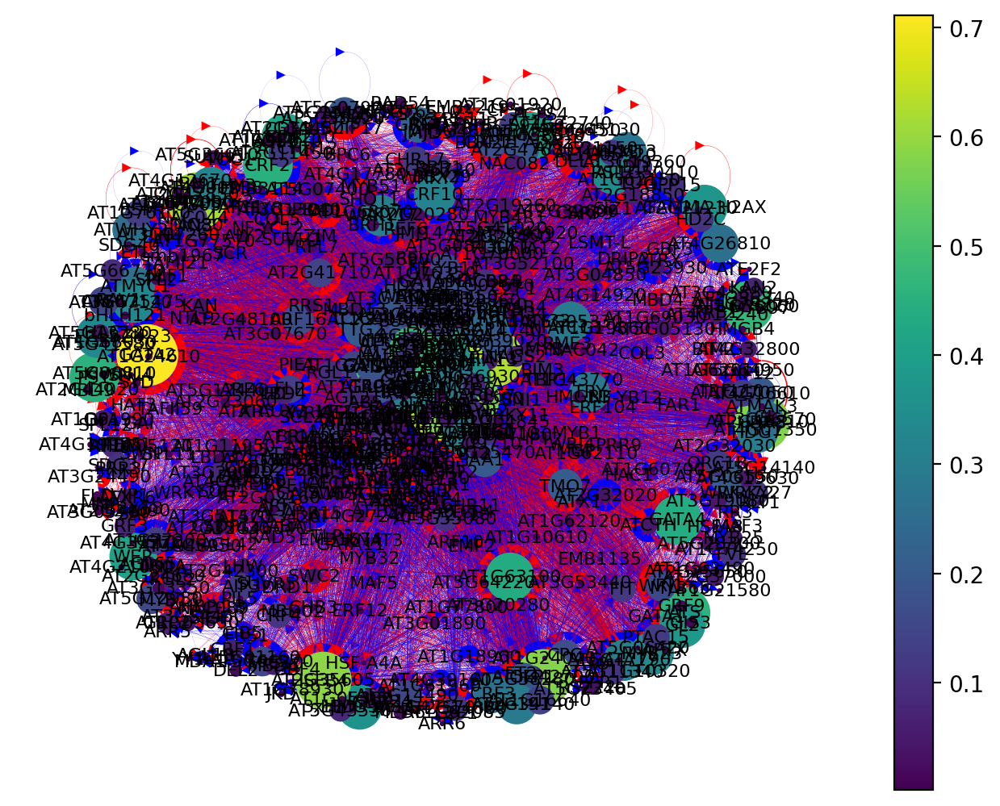

In [56]:
atri = network(0)

In [57]:
atri

,degree_centrality,out_centrality,in_centrality,betweenness_centrality,closeness_centrality,eigenvector_centrality
AT3G19500,1.434057,0.570952,0.863105,0.999079,0.003703,0.108626
AT2G46160,0.886477,0.307179,0.579299,0.997571,0.003446,0.100723
NAI1,0.609349,0.218698,0.390651,0.995092,0.003135,0.086764
BRON,0.686144,0.372287,0.313856,0.993540,0.003159,0.090441
WER,0.794658,0.410684,0.383973,0.991407,0.003341,0.094199
...,...,...,...,...,...,...
HDG1,0.081803,0.061770,0.020033,0.000000,0.001757,0.021656
AT5G23405,0.030050,0.008347,0.021703,0.000000,0.001566,0.009382
EMB2219,0.068447,0.005008,0.063439,0.000000,0.002247,0.018423
SPL2,0.036728,0.010017,0.026711,0.000000,0.002157,0.011940


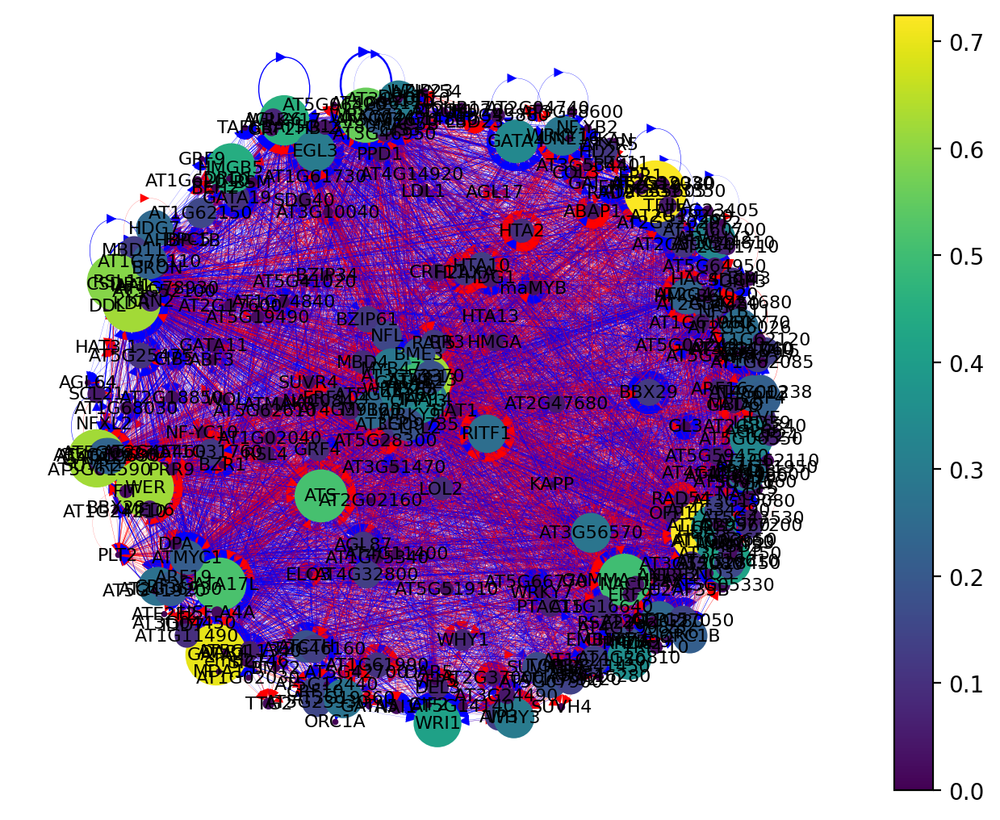

In [58]:
tri = network(1)

In [59]:
tri

,degree_centrality,out_centrality,in_centrality,betweenness_centrality,closeness_centrality,eigenvector_centrality
WRKY72,1.037618,0.557994,0.479624,0.983695,0.003291,0.126875
KDR,1.125392,0.623824,0.501567,0.979151,0.003400,0.127748
GATA2,0.990596,0.695925,0.294671,0.973335,0.003311,0.123841
ATMYC1,0.971787,0.210031,0.761755,0.970505,0.003174,0.130874
RSL1,1.078370,0.592476,0.485893,0.967844,0.003037,0.132763
...,...,...,...,...,...,...
AT5G19490,0.050157,0.025078,0.025078,0.000000,0.001404,0.018192
AT3G07670,0.065831,0.012539,0.053292,0.000000,0.001898,0.022832
AT3G10040,0.062696,0.012539,0.050157,0.000000,0.001792,0.021663
HAT1,0.050157,0.018809,0.031348,0.000000,0.001276,0.017513


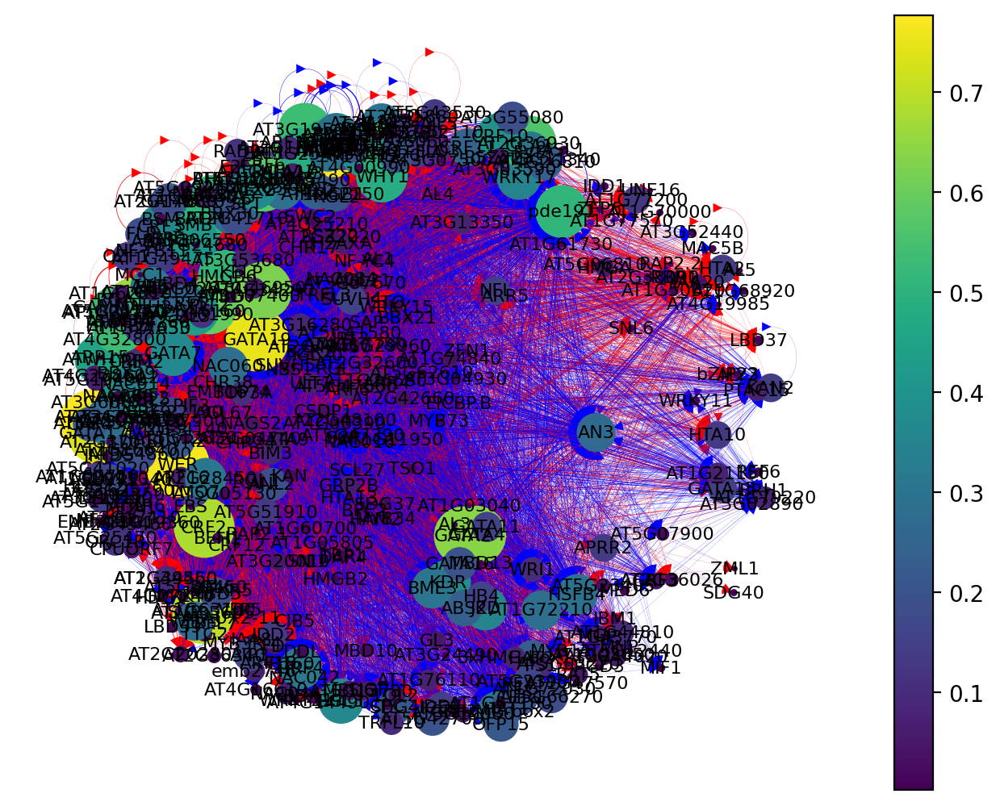

In [60]:
cor = network(2)

In [61]:
cor

,degree_centrality,out_centrality,in_centrality,betweenness_centrality,closeness_centrality,eigenvector_centrality
TOE3,0.896635,0.182692,0.713942,0.987303,0.008701,0.099010
PLT1,1.021635,0.692308,0.329327,0.985119,0.008012,0.102076
pde191,1.117788,0.509615,0.608173,0.983955,0.008165,0.105965
GATA19,1.396635,0.750000,0.646635,0.983804,0.008642,0.111431
AT3G16280,0.730769,0.086538,0.644231,0.982368,0.008325,0.094588
...,...,...,...,...,...,...
EMB2219,0.014423,0.012019,0.002404,0.000000,0.003297,0.004343
AT5G23405,0.064904,0.031250,0.033654,0.000000,0.004289,0.016626
HDG1,0.072115,0.004808,0.067308,0.000000,0.004927,0.018877
SCL27,0.014423,0.004808,0.009615,0.000000,0.002894,0.003661


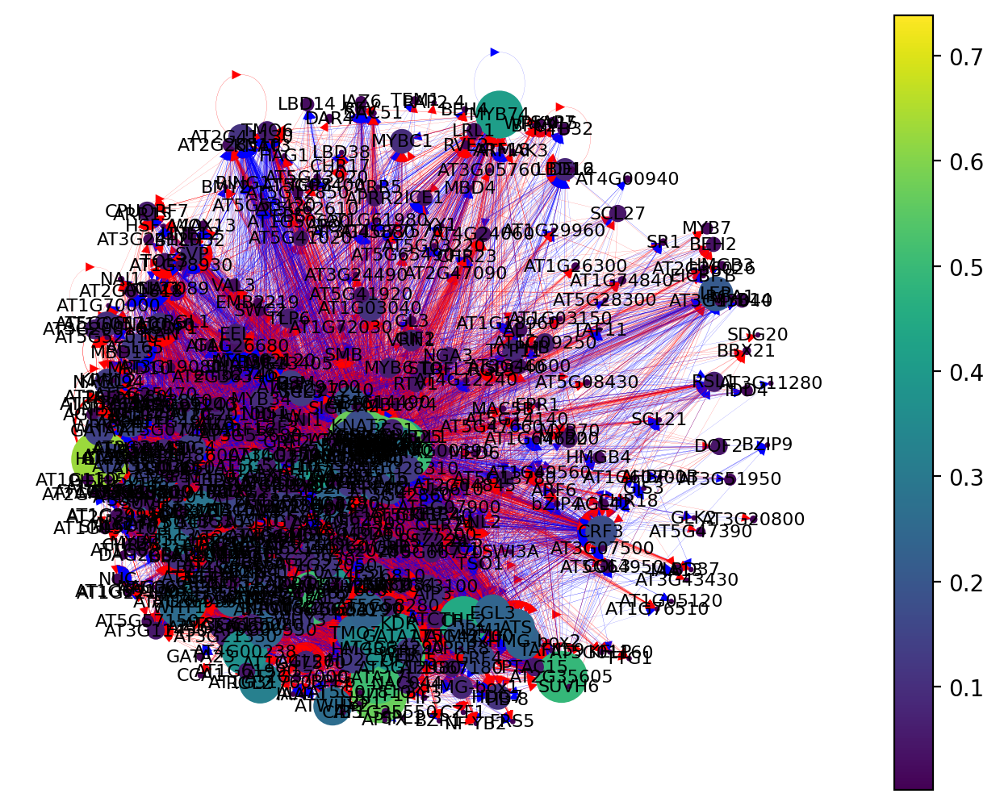

In [62]:
end = network(3)

In [63]:
end

,degree_centrality,out_centrality,in_centrality,betweenness_centrality,closeness_centrality,eigenvector_centrality
IAA20,0.591797,0.107422,0.484375,0.987949,0.002856,0.092543
WER,0.996094,0.529297,0.466797,0.987479,0.002986,0.109388
CRF3,0.519531,0.175781,0.343750,0.986248,0.002812,0.081648
AGL21,0.478516,0.060547,0.417969,0.977495,0.002872,0.086823
3xHMG-box2,0.542969,0.230469,0.312500,0.976895,0.002326,0.081773
...,...,...,...,...,...,...
AT5G51790,0.023438,0.021484,0.001953,0.000000,0.001540,0.007843
DDL,0.042969,0.017578,0.025391,0.000000,0.001582,0.014723
AT2G36026,0.041016,0.007812,0.033203,0.000000,0.001814,0.014072
BIB,0.212891,0.203125,0.009766,0.000000,0.002112,0.049692


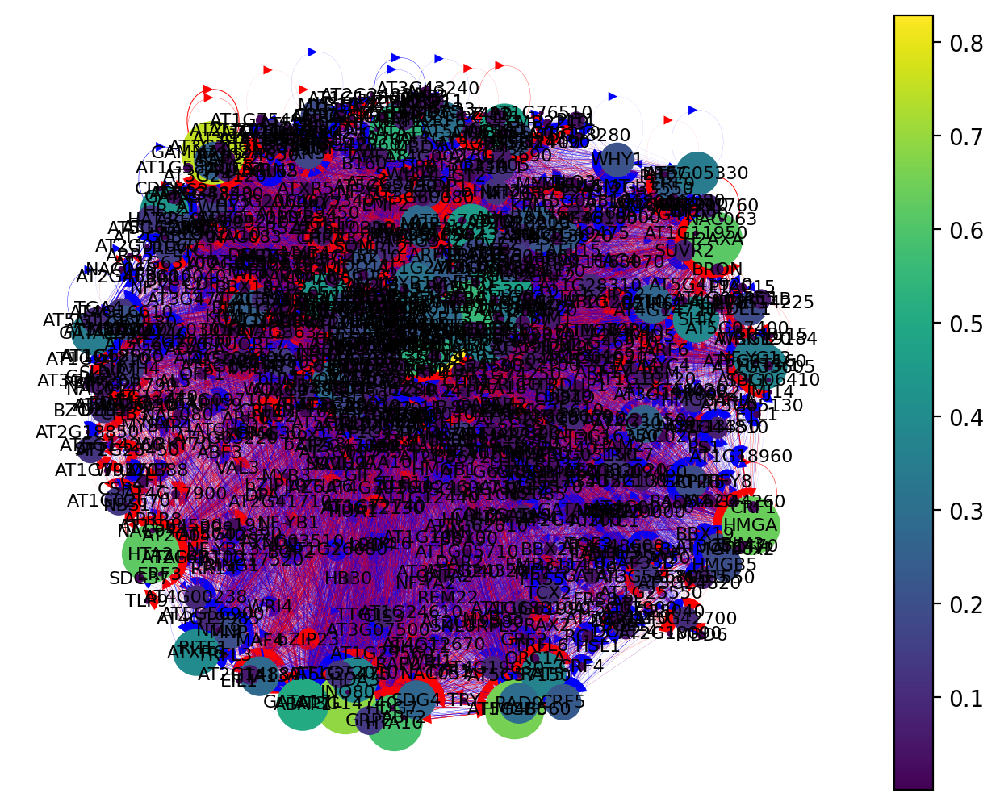

In [64]:
per = network(4)

In [65]:
per

,degree_centrality,out_centrality,in_centrality,betweenness_centrality,closeness_centrality,eigenvector_centrality
LEP,1.511229,0.828269,0.682959,0.994286,0.002940,0.111564
AT3G43430,0.996037,0.550859,0.445178,0.975651,0.002733,0.099988
AT2G34140,0.735799,0.286658,0.449141,0.972119,0.002542,0.087685
AT2G41130,1.129458,0.437252,0.692206,0.969124,0.002782,0.106319
BHLH32,0.780713,0.256275,0.524439,0.965977,0.002719,0.094000
...,...,...,...,...,...,...
AT2G44940,0.096433,0.019815,0.076618,0.000000,0.001735,0.030771
NAC063,0.005284,0.001321,0.003963,0.000000,0.001295,0.001719
bZIP58,0.088507,0.055482,0.033025,0.000000,0.001445,0.027334
ARF9,0.039630,0.003963,0.035667,0.000000,0.001552,0.015674


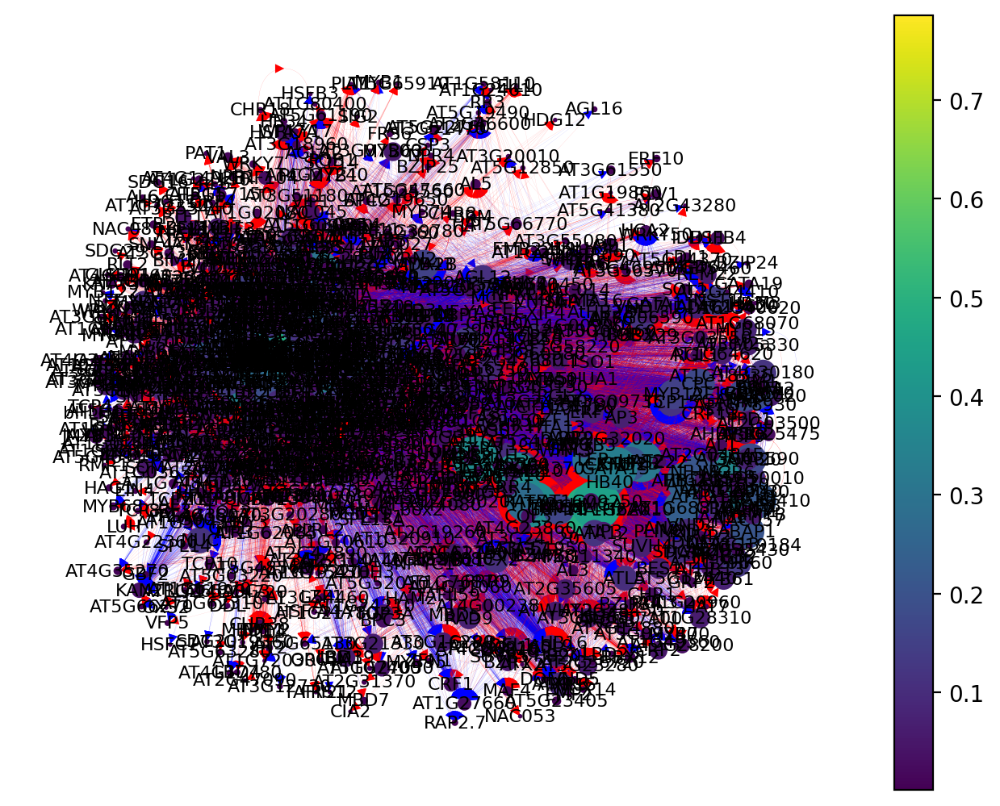

In [66]:
pro = network(5)

In [67]:
pro

,degree_centrality,out_centrality,in_centrality,betweenness_centrality,closeness_centrality,eigenvector_centrality
NST1,0.556622,0.139155,0.417466,0.997523,0.001347,0.077633
OBP2,1.177543,0.459693,0.717850,0.997310,0.001425,0.101482
AT1G61660,1.034549,0.608445,0.426104,0.992280,0.001454,0.094089
AT3G11280,0.786948,0.476967,0.309981,0.992201,0.001358,0.086250
DOF2.4,1.065259,0.306142,0.759117,0.990499,0.001471,0.099403
...,...,...,...,...,...,...
REF6,0.034549,0.011516,0.023033,0.000000,0.000791,0.011252
SNL1,0.092131,0.052783,0.039347,0.000000,0.000857,0.025908
NTM1,0.024952,0.021113,0.003839,0.000000,0.000690,0.009762
HMGB1,0.048944,0.035509,0.013436,0.000000,0.000865,0.015588


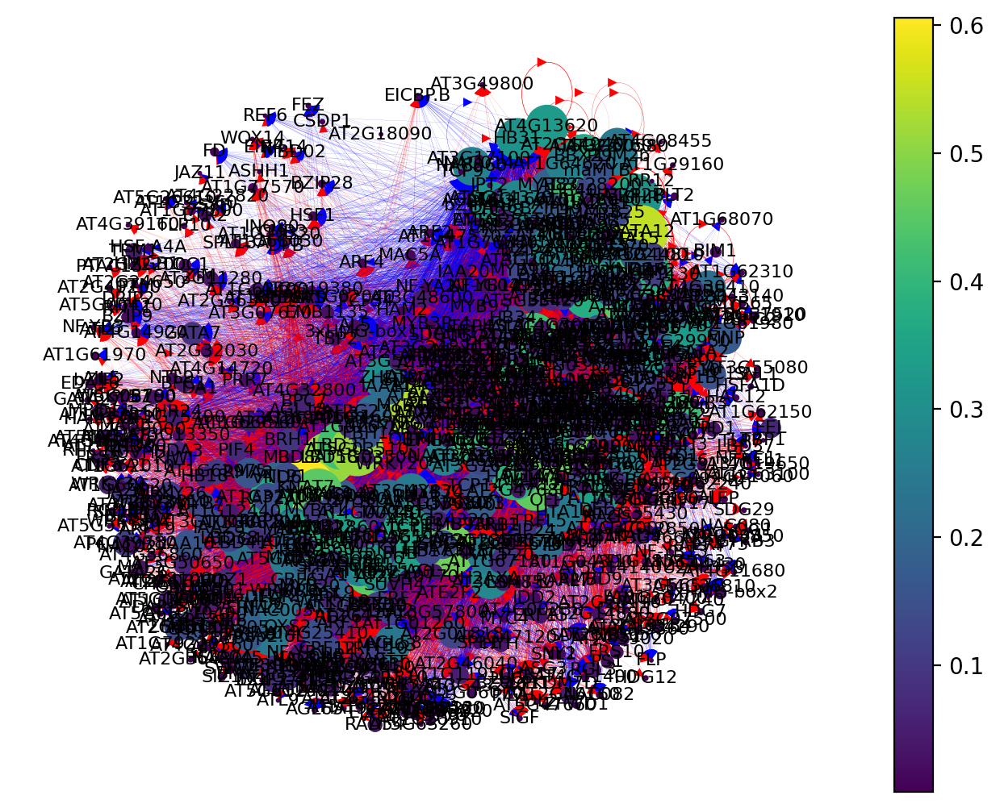

In [68]:
xyl = network(6)

In [69]:
xyl

,degree_centrality,out_centrality,in_centrality,betweenness_centrality,closeness_centrality,eigenvector_centrality
TCP15,0.578624,0.308354,0.270270,0.989072,0.001006,0.070293
BHLH32,0.798526,0.465602,0.332924,0.987886,0.001148,0.081793
UNE12,0.697789,0.410319,0.287469,0.985400,0.001118,0.082030
IAA31,0.769042,0.474201,0.294840,0.985352,0.001121,0.080183
MYB12,1.013514,0.416462,0.597052,0.985152,0.001172,0.090284
...,...,...,...,...,...,...
CHB3,0.013514,0.007371,0.006143,0.000000,0.000517,0.004091
CHC1,0.013514,0.004914,0.008600,0.000000,0.000504,0.003885
AT3G08505,0.089681,0.031941,0.057740,0.000000,0.000645,0.021221
CRF8,0.049140,0.033170,0.015971,0.000000,0.000664,0.013663


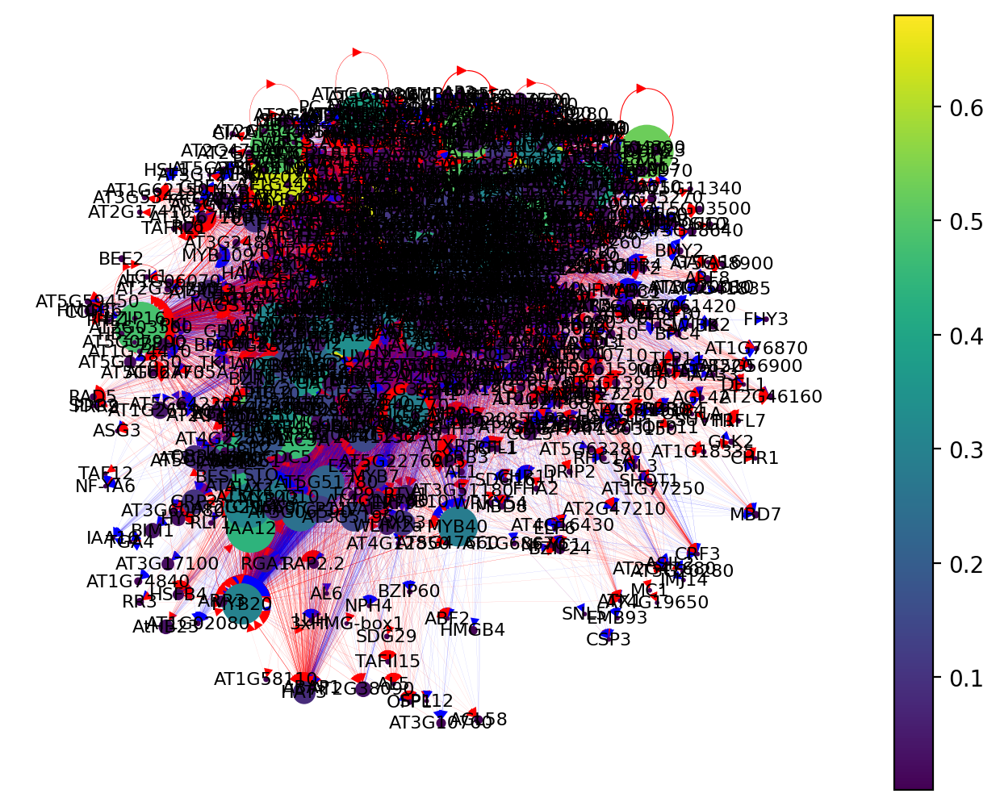

In [70]:
phl = network(7)

In [71]:
phl

,degree_centrality,out_centrality,in_centrality,betweenness_centrality,closeness_centrality,eigenvector_centrality
MYB20,0.895857,0.301232,0.594625,0.995621,0.001181,0.088434
BZIP9,1.108623,0.400896,0.707727,0.993900,0.001340,0.091333
DOF6,0.891377,0.526316,0.365062,0.991496,0.001257,0.088495
AT5G02460,0.982083,0.450168,0.531915,0.990815,0.001279,0.090932
AT1G69580,0.896976,0.431131,0.465845,0.990813,0.001295,0.088092
...,...,...,...,...,...,...
AT3G50650,0.075028,0.038074,0.036954,0.000000,0.000801,0.017592
AT2G24680,0.032475,0.021277,0.011198,0.000000,0.000620,0.008892
B160,0.143337,0.021277,0.122060,0.000000,0.000828,0.035906
bHLH11,0.012318,0.011198,0.001120,0.000000,0.000561,0.004477


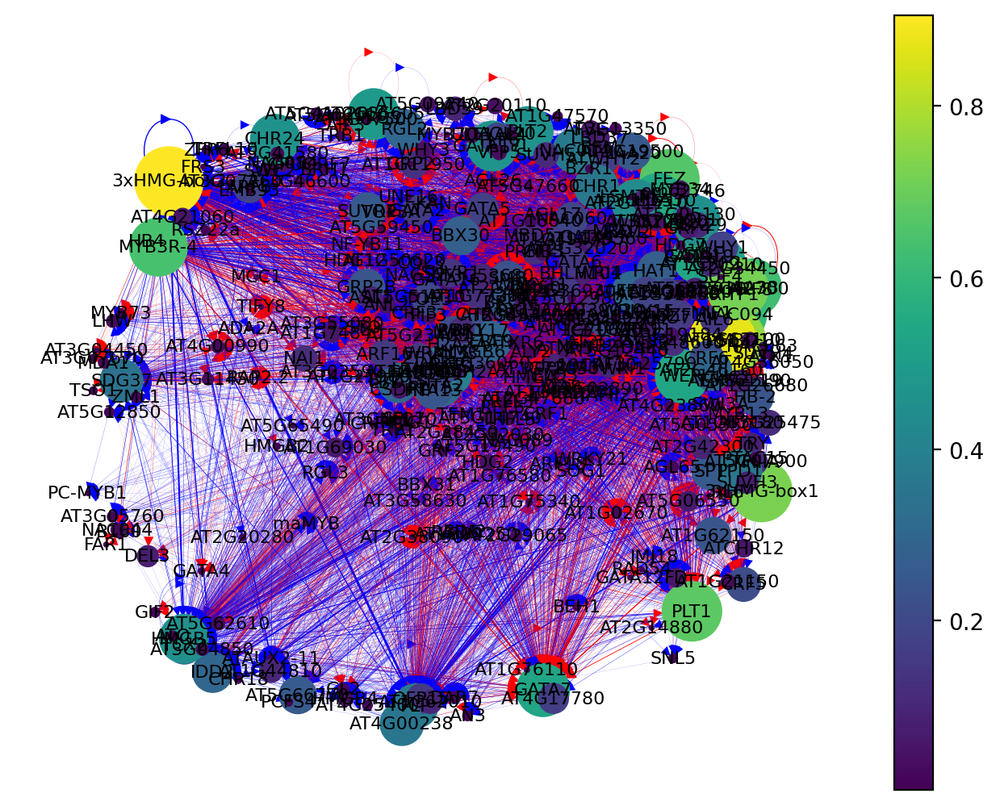

In [72]:
lrc = network(8)

In [73]:
lrc

,degree_centrality,out_centrality,in_centrality,betweenness_centrality,closeness_centrality,eigenvector_centrality
WER,1.278107,0.535503,0.742604,0.995970,0.011346,0.125005
GATA17,0.757396,0.106509,0.650888,0.994680,0.010797,0.109530
GAMMA-H2AX,0.680473,0.387574,0.292899,0.993460,0.010522,0.101885
HDA3,1.310651,0.547337,0.763314,0.991923,0.011070,0.126188
GATA2,0.538462,0.159763,0.378698,0.987033,0.008242,0.088316
...,...,...,...,...,...,...
NF-YB11,0.065089,0.005917,0.059172,0.000000,0.008549,0.019307
AT5G12980,0.029586,0.008876,0.020710,0.000000,0.004749,0.009932
AT1G68920,0.035503,0.017751,0.017751,0.000000,0.005610,0.012134
AT2G28450,0.023669,0.005917,0.017751,0.000000,0.005751,0.008032


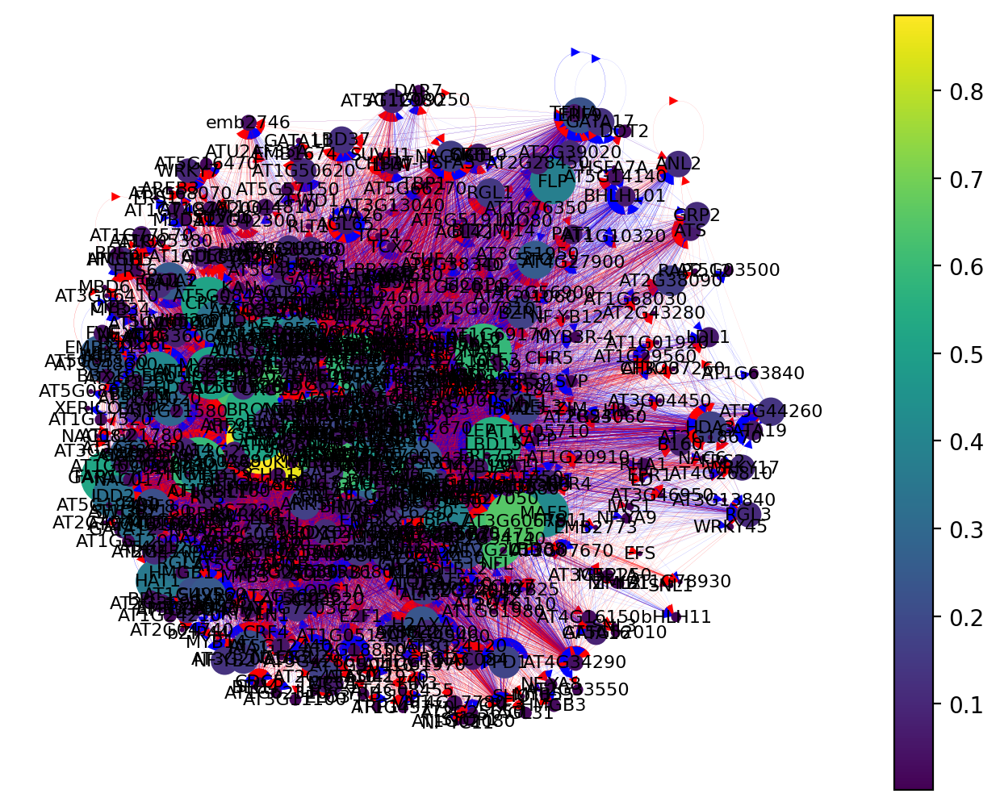

In [74]:
col = network(9)

In [75]:
col

,degree_centrality,out_centrality,in_centrality,betweenness_centrality,closeness_centrality,eigenvector_centrality
RING1,0.907813,0.218750,0.689063,0.995960,0.004748,0.100145
PLT1,1.368750,0.871875,0.496875,0.995738,0.004872,0.111502
HAT1,0.934375,0.364063,0.570312,0.984710,0.004570,0.100171
GATA7,1.342188,0.517188,0.825000,0.984495,0.004814,0.110790
AT1G26680,1.001563,0.414062,0.587500,0.984236,0.003958,0.098139
...,...,...,...,...,...,...
SUVH4,0.071875,0.015625,0.056250,0.000000,0.002556,0.021251
TRFL10,0.015625,0.009375,0.006250,0.000000,0.001577,0.004958
AT1G68070,0.020313,0.009375,0.010938,0.000000,0.001697,0.006449
AT5G61190,0.035938,0.034375,0.001563,0.000000,0.002192,0.012383


In [76]:
atri.columns = ['atri_degree_centrality','atri_out_centrality','atri_in_centrality','atri_betweenness_centrality','atri_closeness_centrality','atri_eigenvector_centrality']
tri.columns = ['tri_degree_centrality','tri_out_centrality','tri_in_centrality','tri_betweenness_centrality','tri_closeness_centrality','tri_eigenvector_centrality']
cor.columns = ['cor_degree_centrality','cor_out_centrality','cor_in_centrality','cor_betweenness_centrality','cor_closeness_centrality','cor_eigenvector_centrality']
end.columns = ['end_degree_centrality','end_out_centrality','end_in_centrality','end_betweenness_centrality','end_closeness_centrality','end_eigenvector_centrality']
per.columns = ['per_degree_centrality','per_out_centrality','per_in_centrality','per_betweenness_centrality','per_closeness_centrality','per_eigenvector_centrality']
pro.columns = ['pro_degree_centrality','pro_out_centrality','pro_in_centrality','pro_betweenness_centrality','pro_closeness_centrality','pro_eigenvector_centrality']
xyl.columns = ['xyl_degree_centrality','xyl_out_centrality','xyl_in_centrality','xyl_betweenness_centrality','xyl_closeness_centrality','xyl_eigenvector_centrality']
phl.columns = ['phl_degree_centrality','phl_out_centrality','phl_in_centrality','phl_betweenness_centrality','phl_closeness_centrality','phl_eigenvector_centrality']
lrc.columns = ['lrc_degree_centrality','lrc_out_centrality','lrc_in_centrality','lrc_betweenness_centrality','lrc_closeness_centrality','lrc_eigenvector_centrality']
col.columns = ['col_degree_centrality','col_out_centrality','col_in_centrality','col_betweenness_centrality','col_closeness_centrality','col_eigenvector_centrality']

In [77]:
## Indentify main regulators in each net work
tff = []
tff = tff + atri[atri['atri_betweenness_centrality']>0].index.tolist()
tff = tff + tri[tri['tri_betweenness_centrality']>0].index.tolist()
tff = tff + lrc[lrc['lrc_betweenness_centrality']>0].index.tolist()
tff = tff + cor[cor['cor_betweenness_centrality']>0].index.tolist()
tff = tff + end[end['end_betweenness_centrality']>0].index.tolist()
tff = tff + per[per['per_betweenness_centrality']>0].index.tolist()
tff = tff + pro[pro['pro_betweenness_centrality']>0].index.tolist()
tff = tff + xyl[xyl['xyl_betweenness_centrality']>0].index.tolist()
tff = tff + phl[phl['phl_betweenness_centrality']>0].index.tolist()
tff = tff + col[col['col_betweenness_centrality']>0].index.tolist()
tf_occurance = pd.DataFrame(pd.Series(tff).value_counts())
tf_occurance = tf_occurance.rename(columns={
    'count': 'tf_occurance'
})
tf_spec = pd.concat([tf_occurance, atri, tri, lrc, cor, end, per, pro, xyl, phl, col], axis=1)
tf_spec = tf_spec.fillna(0)

In [78]:
## Epidermis (atri, tri, lrc)
celltype1='atri'
celltype2='tri'
celltype3='lrc'
ts = tf_spec[tf_spec['tf_occurance']==3][[celltype1+'_betweenness_centrality', celltype2+'_betweenness_centrality', celltype3+'_betweenness_centrality', celltype1+'_out_centrality', celltype2+'_out_centrality', celltype3+'_out_centrality', celltype1+'_in_centrality', celltype2+'_in_centrality', celltype3+'_in_centrality']]
tso = (ts > 0)
ts['centrality_count'] = tso.sum(axis=1)
ts['centrality_sum'] = ts.sum(axis=1)
ts[ts['centrality_count']==9].sort_values(['centrality_count','centrality_sum'], ascending=False)

,atri_betweenness_centrality,tri_betweenness_centrality,lrc_betweenness_centrality,atri_out_centrality,tri_out_centrality,lrc_out_centrality,atri_in_centrality,tri_in_centrality,lrc_in_centrality,centrality_count,centrality_sum


In [79]:
## atri, tri
celltype1='atri'
celltype2='tri'
ts = tf_spec[tf_spec['tf_occurance']==2][[celltype1+'_betweenness_centrality', celltype2+'_betweenness_centrality', celltype1+'_out_centrality', celltype2+'_out_centrality', celltype1+'_in_centrality', celltype2+'_in_centrality']]
tso = (ts > 0)
ts['centrality_count'] = tso.sum(axis=1)
ts['centrality_sum'] = ts.sum(axis=1)
ts[ts['centrality_count']==6].sort_values(['centrality_count','centrality_sum'], ascending=False)

,atri_betweenness_centrality,tri_betweenness_centrality,atri_out_centrality,tri_out_centrality,atri_in_centrality,tri_in_centrality,centrality_count,centrality_sum
WRKY72,0.067258,0.983695,0.168614,0.557994,0.025042,0.479624,6,8.282227
MYB23,0.336575,0.410865,0.338898,0.244514,0.098497,0.134796,6,7.564147
AT2G36026,0.000293,0.614016,0.116861,0.260188,0.026711,0.128527,6,7.146596
AT1G61990,0.668014,0.000138,0.053422,0.106583,0.080134,0.112853,6,7.021144
RHD6,0.007680,0.574693,0.086811,0.178683,0.035058,0.094044,6,6.976970
WHY3,0.000003,0.030697,0.108514,0.297806,0.031720,0.137931,6,6.606671
WRKY27,0.000779,0.004022,0.116861,0.137931,0.028381,0.072100,6,6.360074
LOL2,0.000073,0.000611,0.053422,0.087774,0.006678,0.028213,6,6.176771


In [80]:
## Atrichoblast specific
celltype = 'atri'
cs = tf_spec[tf_spec['tf_occurance']==1][[celltype+'_betweenness_centrality', celltype+'_out_centrality',celltype+'_in_centrality']]
cso = (cs > 0)
cs['centrality_count'] = cso.sum(axis=1)
cs['centrality_sum'] = cs.sum(axis=1)
cs[cs['centrality_count']==3].sort_values(['centrality_count',celltype+'_betweenness_centrality'], ascending=False)

,atri_betweenness_centrality,atri_out_centrality,atri_in_centrality,centrality_count,centrality_sum
DAR4,0.932745,0.051753,0.183639,3,4.168137
TTG2,0.751967,0.198664,0.118531,3,4.069162
DDL,0.447426,0.043406,0.071786,3,3.562618
PIE1,0.397563,0.028381,0.051753,3,3.477697
MBD6,0.390082,0.058431,0.070117,3,3.518629
AT3G11450,0.060002,0.121870,0.050083,3,3.231956
AT2G23060,0.045354,0.010017,0.095159,3,3.150530
AT1G19860,0.014648,0.008347,0.043406,3,3.066401
AT5G07400,0.009913,0.028381,0.053422,3,3.091716
AT4G14490,0.004403,0.153589,0.026711,3,3.184703


In [81]:
## Trichoblast specific
celltype = 'tri'
cs = tf_spec[tf_spec['tf_occurance']==1][[celltype+'_betweenness_centrality', celltype+'_out_centrality',celltype+'_in_centrality']]
cso = (cs > 0)
cs['centrality_count'] = cso.sum(axis=1)
cs['centrality_sum'] = cs.sum(axis=1)
cs[cs['centrality_count']==3].sort_values(['centrality_count',celltype+'_betweenness_centrality'], ascending=False)

,tri_betweenness_centrality,tri_out_centrality,tri_in_centrality,centrality_count,centrality_sum
OFP13,0.747264,0.357367,0.094044,3,4.198675
TCP24,0.676781,0.068966,0.184953,3,3.930699
AGL87,0.665296,0.109718,0.181818,3,3.956832
WRKY9,0.548777,0.260188,0.078370,3,3.887335
AT3G53370,0.503559,0.620690,0.084639,3,4.208888
MYB47,0.079395,0.288401,0.090909,3,3.458705
AT5G64950,0.069458,0.050157,0.047022,3,3.166637
HDG1,0.049191,0.053292,0.109718,3,3.212200
IAA14,0.044045,0.294671,0.056426,3,3.395142
AT3G24490,0.017202,0.043887,0.084639,3,3.145729


In [82]:
## LRC specific
celltype = 'lrc'
cs = tf_spec[tf_spec['tf_occurance']==1][[celltype+'_betweenness_centrality', celltype+'_out_centrality',celltype+'_in_centrality']]
cso = (cs > 0)
cs['centrality_count'] = cso.sum(axis=1)
cs['centrality_sum'] = cs.sum(axis=1)
cs[cs['centrality_count']==3].sort_values(['centrality_count',celltype+'_betweenness_centrality'], ascending=False)

,lrc_betweenness_centrality,lrc_out_centrality,lrc_in_centrality,centrality_count,centrality_sum


In [83]:
## Columella specific
celltype = 'col'
cs = tf_spec[tf_spec['tf_occurance']==1][[celltype+'_betweenness_centrality', celltype+'_out_centrality',celltype+'_in_centrality']]
cso = (cs > 0)
cs['centrality_count'] = cso.sum(axis=1)
cs['centrality_sum'] = cs.sum(axis=1)
cs[cs['centrality_count']==3].sort_values(['centrality_count',celltype+'_betweenness_centrality'], ascending=False)

,col_betweenness_centrality,col_out_centrality,col_in_centrality,centrality_count,centrality_sum
AT3G19184,0.951467,0.060938,0.321875,3,4.334280
NAC016,0.948863,0.306250,0.307813,3,4.562925
HSF A4A,0.811752,0.053125,0.109375,3,3.974252
AGL94,0.628365,0.110938,0.104688,3,3.843990
AT2G32030,0.547386,0.017188,0.118750,3,3.683324
AXR3,0.294195,0.340625,0.040625,3,3.675445
AT5G09240,0.282583,0.114063,0.125000,3,3.521645
B160,0.206675,0.079688,0.068750,3,3.355113
AT3G52440,0.192383,0.365625,0.026563,3,3.584571
AGL102,0.054915,0.054688,0.107813,3,3.217415


In [84]:
## Ground tissue
celltype1='cor'
celltype2='end'
ts = tf_spec[tf_spec['tf_occurance']==2][[celltype1+'_betweenness_centrality', celltype2+'_betweenness_centrality', celltype1+'_out_centrality', celltype2+'_out_centrality', celltype1+'_in_centrality', celltype2+'_in_centrality']]
tso = (ts > 0)
ts['centrality_count'] = tso.sum(axis=1)
ts['centrality_sum'] = ts.sum(axis=1)
ts[ts['centrality_count']==6].sort_values(['centrality_count','centrality_sum'], ascending=False)

,cor_betweenness_centrality,end_betweenness_centrality,cor_out_centrality,end_out_centrality,cor_in_centrality,end_in_centrality,centrality_count,centrality_sum
JKD,0.161394,0.499438,0.350962,0.304688,0.009615,0.064453,6,7.390549
SIGF,0.315506,0.035840,0.048077,0.017578,0.098558,0.076172,6,6.591731
AT4G23860,0.242470,0.000260,0.062500,0.017578,0.050481,0.035156,6,6.408445
AT1G03650,0.004657,0.003027,0.060096,0.046875,0.052885,0.160156,6,6.327696
TSO1,0.000006,0.002997,0.012019,0.007812,0.016827,0.052734,6,6.092395


In [85]:
## Cortex specific
celltype = 'cor'
cs = tf_spec[tf_spec['tf_occurance']==1][[celltype+'_betweenness_centrality', celltype+'_out_centrality',celltype+'_in_centrality']]
cso = (cs > 0)
cs['centrality_count'] = cso.sum(axis=1)
cs['centrality_sum'] = cs.sum(axis=1)
cs[cs['centrality_count']==3].sort_values(['centrality_count',celltype+'_betweenness_centrality'], ascending=False)

,cor_betweenness_centrality,cor_out_centrality,cor_in_centrality,centrality_count,centrality_sum
HB4,0.127016,0.153846,0.007212,3,3.288073
AT1G60700,0.015234,0.014423,0.112981,3,3.142638
ELO3,0.000122,0.103365,0.016827,3,3.120314


In [86]:
## Endodermis specific
celltype = 'end'
cs = tf_spec[tf_spec['tf_occurance']==1][[celltype+'_betweenness_centrality', celltype+'_out_centrality',celltype+'_in_centrality']]
cso = (cs > 0)
cs['centrality_count'] = cso.sum(axis=1)
cs['centrality_sum'] = cs.sum(axis=1)
cs[cs['centrality_count']==3].sort_values(['centrality_count',celltype+'_betweenness_centrality'], ascending=False)

,end_betweenness_centrality,end_out_centrality,end_in_centrality,centrality_count,centrality_sum
MYB68,0.539406,0.562500,0.314453,3,4.416360
MYB36,0.500134,0.693359,0.359375,3,4.552868
MYB3,0.455468,0.640625,0.146484,3,4.242577
SCR,0.287797,0.552734,0.220703,3,4.061235
RVN,0.093742,0.248047,0.070312,3,3.412102
AT3G13040,0.089817,0.021484,0.070312,3,3.181614
BSM,0.054638,0.015625,0.052734,3,3.122997
HAT7,0.023720,0.576172,0.015625,3,3.615517
AT1G72210,0.014341,0.179688,0.029297,3,3.223325
JMJD5,0.011180,0.017578,0.029297,3,3.058055


In [87]:
## Stele
celltype1='per'
celltype2='pro'
celltype3='xyl'
celltype4='phl'
ts = tf_spec[tf_spec['tf_occurance']==4][[celltype1+'_betweenness_centrality', celltype2+'_betweenness_centrality', celltype3+'_betweenness_centrality', celltype4+'_betweenness_centrality', celltype1+'_out_centrality', celltype2+'_out_centrality', celltype3+'_out_centrality', celltype4+'_out_centrality', celltype1+'_in_centrality', celltype2+'_in_centrality', celltype3+'_in_centrality', celltype4+'_in_centrality']]
tso = (ts > 0)
ts['centrality_count'] = tso.sum(axis=1)
ts['centrality_sum'] = ts.sum(axis=1)
ts[ts['centrality_count']==12].sort_values(['centrality_count','centrality_sum'], ascending=False)

,per_betweenness_centrality,pro_betweenness_centrality,xyl_betweenness_centrality,phl_betweenness_centrality,per_out_centrality,pro_out_centrality,xyl_out_centrality,phl_out_centrality,per_in_centrality,pro_in_centrality,xyl_in_centrality,phl_in_centrality,centrality_count,centrality_sum
AT3G43430,0.975651,0.730029,0.939741,0.775860,0.550859,0.619962,0.248157,0.679731,0.445178,0.282150,0.314496,0.349384,12,18.911198
AT1G69580,0.761739,0.983678,0.920997,0.990813,0.095112,0.287908,0.085995,0.431131,0.169089,0.656430,0.304668,0.465845,12,18.153405
DAG1,0.870339,0.650648,0.727170,0.853704,0.330251,0.393474,0.088452,0.510638,0.286658,0.342610,0.237101,0.301232,12,17.592277
AT4G30410,0.930193,0.875508,0.950479,0.540403,0.466314,0.217850,0.213759,0.347144,0.282695,0.171785,0.337838,0.070549,12,17.404518
IAA13,0.841542,0.962271,0.758644,0.964890,0.141347,0.234165,0.090909,0.115342,0.182299,0.194818,0.178133,0.258679,12,16.923038
BT1,0.247636,0.955381,0.891375,0.608766,0.142668,0.276392,0.357494,0.300112,0.183620,0.326296,0.388206,0.190370,12,16.868315
AT3G60490,0.605146,0.559458,0.000029,0.962918,0.244386,0.439539,0.011057,0.639418,0.116248,0.564299,0.081081,0.625980,12,16.849558
DOF2.4,0.000619,0.990499,0.464114,0.931302,0.031704,0.306142,0.082310,0.646137,0.046235,0.759117,0.105651,0.444569,12,16.808397
ABO3,0.694575,0.914774,0.002137,0.754951,0.100396,0.634357,0.199017,0.558791,0.121532,0.334933,0.045455,0.389698,12,16.750616
UNE12,0.572418,0.543240,0.985400,0.756611,0.120211,0.379079,0.410319,0.281075,0.113606,0.114203,0.287469,0.080627,12,16.644259


In [88]:
## Pericycle
celltype = 'per'
cs = tf_spec[tf_spec['tf_occurance']==1][[celltype+'_betweenness_centrality', celltype+'_out_centrality',celltype+'_in_centrality']]
cso = (cs > 0)
cs['centrality_count'] = cso.sum(axis=1)
cs['centrality_sum'] = cs.sum(axis=1)
cs[cs['centrality_count']==3].sort_values(['centrality_count',celltype+'_betweenness_centrality'], ascending=False)

,per_betweenness_centrality,per_out_centrality,per_in_centrality,centrality_count,centrality_sum
AT3G61550,0.799494,0.076618,0.097754,3,3.973866
AT4G20970,0.713314,0.091149,0.116248,3,3.920712
ERF10,0.521286,0.187583,0.151915,3,3.860784
GATA23,0.450134,0.170410,0.076618,3,3.697162
IDD11,0.264213,0.216645,0.130779,3,3.611637
TRFL7,0.029448,0.034346,0.026420,3,3.090214
DBP1,0.024425,0.019815,0.025099,3,3.069339
AT1G78930,0.012179,0.018494,0.071334,3,3.102007
ASHH3,0.001106,0.022457,0.047556,3,3.071119
RTV1,0.001015,0.043593,0.038309,3,3.082917


In [89]:
## Procambium
celltype = 'pro'
cs = tf_spec[tf_spec['tf_occurance']==1][[celltype+'_betweenness_centrality', celltype+'_out_centrality',celltype+'_in_centrality']]
cso = (cs > 0)
cs['centrality_count'] = cso.sum(axis=1)
cs['centrality_sum'] = cs.sum(axis=1)
cs[cs['centrality_count']==3].sort_values(['centrality_count',celltype+'_betweenness_centrality'], ascending=False)

,pro_betweenness_centrality,pro_out_centrality,pro_in_centrality,centrality_count,centrality_sum
AT1G01640,5.405486e-01,0.056622,0.021113,3,3.618284
AT1G62975,4.369792e-01,0.081574,0.030710,3,3.549263
bZIP23,5.652877e-02,0.012476,0.003839,3,3.072844
HB-1,4.612703e-02,0.014395,0.047985,3,3.108507
JAZ6,3.604518e-02,0.055662,0.048944,3,3.140652
BEH2,3.033035e-03,0.043186,0.119002,3,3.165221
CDF2,2.974034e-03,0.064299,0.083493,3,3.150767
KNAT6,2.502024e-03,0.095969,0.054702,3,3.153174
LBD29,1.562612e-03,0.136276,0.068138,3,3.205977
OBF5,1.273137e-03,0.090211,0.038388,3,3.129872


In [90]:
## Xylem
celltype = 'xyl'
cs = tf_spec[tf_spec['tf_occurance']==1][[celltype+'_betweenness_centrality', celltype+'_out_centrality',celltype+'_in_centrality']]
cso = (cs > 0)
cs['centrality_count'] = cso.sum(axis=1)
cs['centrality_sum'] = cs.sum(axis=1)
cs[cs['centrality_count']==3].sort_values(['centrality_count',celltype+'_betweenness_centrality'], ascending=False)

,xyl_betweenness_centrality,xyl_out_centrality,xyl_in_centrality,centrality_count,centrality_sum
VND4,0.983333,0.386978,0.380835,3,4.751146
MYB46,0.977289,0.533170,0.361179,3,4.871637
VND7,0.955970,0.420147,0.377150,3,4.753268
MYB50,0.942537,0.119165,0.402948,3,4.464650
VND1,0.941278,0.342752,0.326781,3,4.610811
VND5,0.921148,0.374693,0.297297,3,4.593138
AT1G68200,0.908428,0.147420,0.171990,3,4.227838
BBX31,0.887668,0.355037,0.181818,3,4.424523
TCP10,0.886201,0.149877,0.281327,3,4.317405
HB31,0.884470,0.305897,0.380835,3,4.571202


In [91]:
## Phloem
celltype = 'phl'
cs = tf_spec[tf_spec['tf_occurance']==1][[celltype+'_betweenness_centrality', celltype+'_out_centrality',celltype+'_in_centrality']]
cso = (cs > 0)
cs['centrality_count'] = cso.sum(axis=1)
cs['centrality_sum'] = cs.sum(axis=1)
cs[cs['centrality_count']==3].sort_values(['centrality_count',celltype+'_betweenness_centrality'], ascending=False)

,phl_betweenness_centrality,phl_out_centrality,phl_in_centrality,centrality_count,centrality_sum
AT3G46600,0.948114,0.095185,0.170213,3,4.213512
SPL10,0.930477,0.061590,0.198208,3,4.190275
AT2G03500,0.708464,0.481523,0.278835,3,4.468822
AT3G12730,0.602997,0.395297,0.211646,3,4.209940
AT4G39780,0.541354,0.098544,0.095185,3,3.735083
RAP2.7,0.524287,0.117581,0.104143,3,3.746012
MYB10,0.438067,0.297872,0.076148,3,3.812087
MYB55,0.296968,0.043673,0.221725,3,3.562366
WRKY45,0.194015,0.144457,0.033595,3,3.372067
SIGC,0.177906,0.021277,0.071669,3,3.270851


## Search for individual genes

In [92]:
gene = 'SHR'
tf_spec[tf_spec.index==gene][tf_spec[tf_spec.index==gene].columns[tf_spec[tf_spec.index==gene].any()]]

,tf_occurance,end_degree_centrality,end_out_centrality,end_in_centrality,end_betweenness_centrality,end_closeness_centrality,end_eigenvector_centrality,per_degree_centrality,per_out_centrality,per_in_centrality,...,xyl_out_centrality,xyl_in_centrality,xyl_betweenness_centrality,xyl_closeness_centrality,xyl_eigenvector_centrality,phl_degree_centrality,phl_out_centrality,phl_in_centrality,phl_closeness_centrality,phl_eigenvector_centrality
SHR,4.0,0.162109,0.060547,0.101562,0.838689,0.001708,0.04138,0.612946,0.389696,0.22325,...,0.30344,0.302211,0.930201,0.001047,0.077013,0.051512,0.005599,0.045913,0.000836,0.015495


In [93]:
gene = 'BLJ'
tf_spec[tf_spec.index==gene][tf_spec[tf_spec.index==gene].columns[tf_spec[tf_spec.index==gene].any()]]

,end_degree_centrality,end_out_centrality,end_in_centrality,end_closeness_centrality,end_eigenvector_centrality
BLJ,0.28125,0.271484,0.009766,0.002145,0.060075


In [94]:
gene = 'JKD'
tf_spec[tf_spec.index==gene][tf_spec[tf_spec.index==gene].columns[tf_spec[tf_spec.index==gene].any()]]

,tf_occurance,atri_degree_centrality,atri_out_centrality,atri_in_centrality,atri_closeness_centrality,atri_eigenvector_centrality,cor_degree_centrality,cor_out_centrality,cor_in_centrality,cor_betweenness_centrality,...,end_out_centrality,end_in_centrality,end_betweenness_centrality,end_closeness_centrality,end_eigenvector_centrality,col_degree_centrality,col_out_centrality,col_in_centrality,col_closeness_centrality,col_eigenvector_centrality
JKD,2.0,0.016694,0.003339,0.013356,0.001438,0.005749,0.360577,0.350962,0.009615,0.161394,...,0.304688,0.064453,0.499438,0.002302,0.073275,0.007812,0.003125,0.004688,0.001647,0.003063


In [95]:
gene = 'RVN'
tf_spec[tf_spec.index==gene][tf_spec[tf_spec.index==gene].columns[tf_spec[tf_spec.index==gene].any()]]

,tf_occurance,end_degree_centrality,end_out_centrality,end_in_centrality,end_betweenness_centrality,end_closeness_centrality,end_eigenvector_centrality
RVN,1.0,0.318359,0.248047,0.070312,0.093742,0.002287,0.064905


In [96]:
gene = 'BIB'
tf_spec[tf_spec.index==gene][tf_spec[tf_spec.index==gene].columns[tf_spec[tf_spec.index==gene].any()]]

,end_degree_centrality,end_out_centrality,end_in_centrality,end_closeness_centrality,end_eigenvector_centrality
BIB,0.212891,0.203125,0.009766,0.002112,0.049692


In [97]:
gene = 'IME'
tf_spec[tf_spec.index==gene][tf_spec[tf_spec.index==gene].columns[tf_spec[tf_spec.index==gene].any()]]

""


In [98]:
gene = 'MYB66'
tf_spec[tf_spec.index==gene][tf_spec[tf_spec.index==gene].columns[tf_spec[tf_spec.index==gene].any()]]

""


In [99]:
gene = 'GL2'
tf_spec[tf_spec.index==gene][tf_spec[tf_spec.index==gene].columns[tf_spec[tf_spec.index==gene].any()]]

,tf_occurance,atri_degree_centrality,atri_out_centrality,atri_in_centrality,atri_betweenness_centrality,atri_closeness_centrality,atri_eigenvector_centrality,tri_degree_centrality,tri_out_centrality,tri_in_centrality,...,cor_out_centrality,cor_in_centrality,cor_betweenness_centrality,cor_closeness_centrality,cor_eigenvector_centrality,end_degree_centrality,end_out_centrality,end_in_centrality,end_closeness_centrality,end_eigenvector_centrality
GL2,2.0,0.519199,0.380634,0.138564,0.849063,0.002686,0.075841,0.128527,0.050157,0.07837,...,0.165865,0.360577,0.917395,0.00696,0.081382,0.058594,0.037109,0.021484,0.001511,0.017833


In [101]:
tf_spec.to_csv('TF_GRN_centrality_t0-t1_zscore3.csv', index=True)